<a href="https://colab.research.google.com/github/Anweshasen98/Custom-Object-Detection/blob/main/Custom_Object_Detection_YOLOv8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Custom Object Detection Using YOLOv8**



*   Using Google Colab GPUs
*   Installing Ultralytics and Loading Dataset already Preprocessed as per YOLOv8 format



In [ ]:
# The dataset/files used in this colab notebook can be dowloaded from "https://drive.google.com/drive/folders/1FZ0if38T3tNEfZ-JMW37DoW-j-G_vAjt?usp=drive_link"

In [ ]:
#Check Available GPUs
!nvidia-smi

Thu Feb  8 06:20:57 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   46C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
import os
print(os.getcwd())

/content


## Install YOLOv8



In [ ]:
# Install Yolov8 from Ultralytics
!pip install ultralytics==8.0.196
from IPython import display
display.clear_output()
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.3/78.2 GB disk)


In [ ]:
from ultralytics import YOLO
from IPython.display import display, Image

In [ ]:
# Function to extract zip files
import zipfile
def extract_zip(zip_path, extract_to):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to)

# Paths to the uploaded zip files
dataset_zip_path = '/content/dataset.zip'

# Paths to extract the contents of the zip files
extracted_dataset_path = './'

# Creating directories if they don't exist and extracting contents
os.makedirs(extracted_dataset_path, exist_ok=True)
extract_zip(dataset_zip_path, extracted_dataset_path)


## **Training on Custom Dataset**

---



In [ ]:
# To be Executed only if default data.yaml file is required to be changed
# %%writefile data.yaml
# train: /content/dataset/train/images
# val: /content/dataset/valid/images
# test: /content/dataset/test/images
# nc: 1
# names: ['drone']

In [ ]:
# Using Pre-defined weights of YOLOv8 and training our customised model
%cd {HOME}
!yolo task=detect mode=train model=yolov8s.pt data=/content/dataset/data.yaml epochs=50 imgsz=640 plots=True

/content
100% 21.5M/21.5M [00:00<00:00, 300MB/s]
New https://pypi.org/project/ultralytics/8.1.10 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/dataset/data.yaml, epochs=50, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, lin

In [ ]:
!ls {HOME}/runs/detect/train/

args.yaml					    PR_curve.png	train_batch561.jpg
confusion_matrix_normalized.png			    R_curve.png		train_batch562.jpg
confusion_matrix.png				    results.csv		val_batch0_labels.jpg
events.out.tfevents.1707373427.c155c55e77b1.1381.0  results.png		val_batch0_pred.jpg
F1_curve.png					    train_batch0.jpg	val_batch1_labels.jpg
labels_correlogram.jpg				    train_batch1.jpg	val_batch1_pred.jpg
labels.jpg					    train_batch2.jpg	weights
P_curve.png					    train_batch560.jpg


## Analysing Results

---



/content


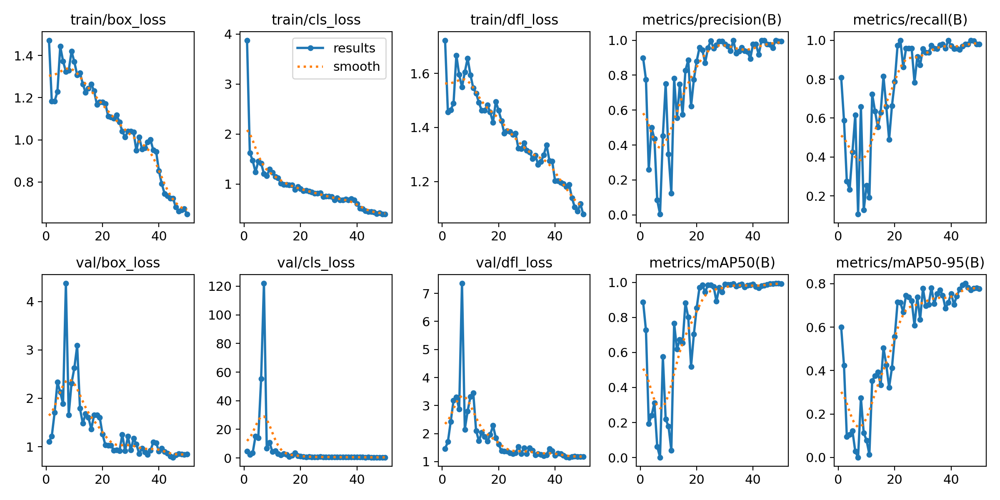

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

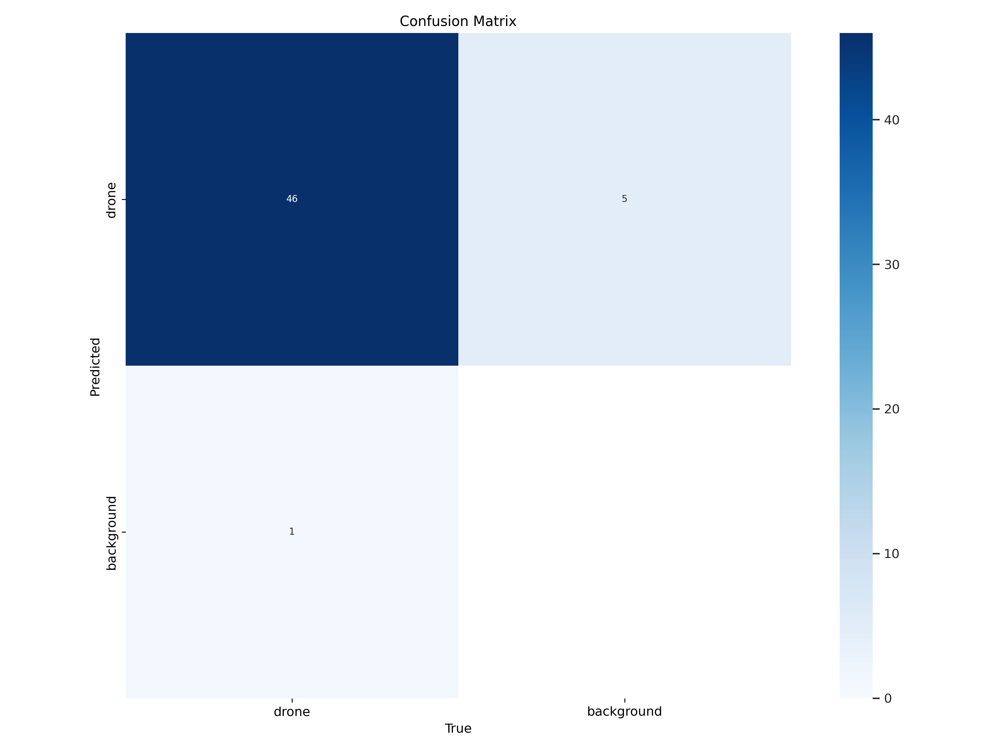

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

/content
/content


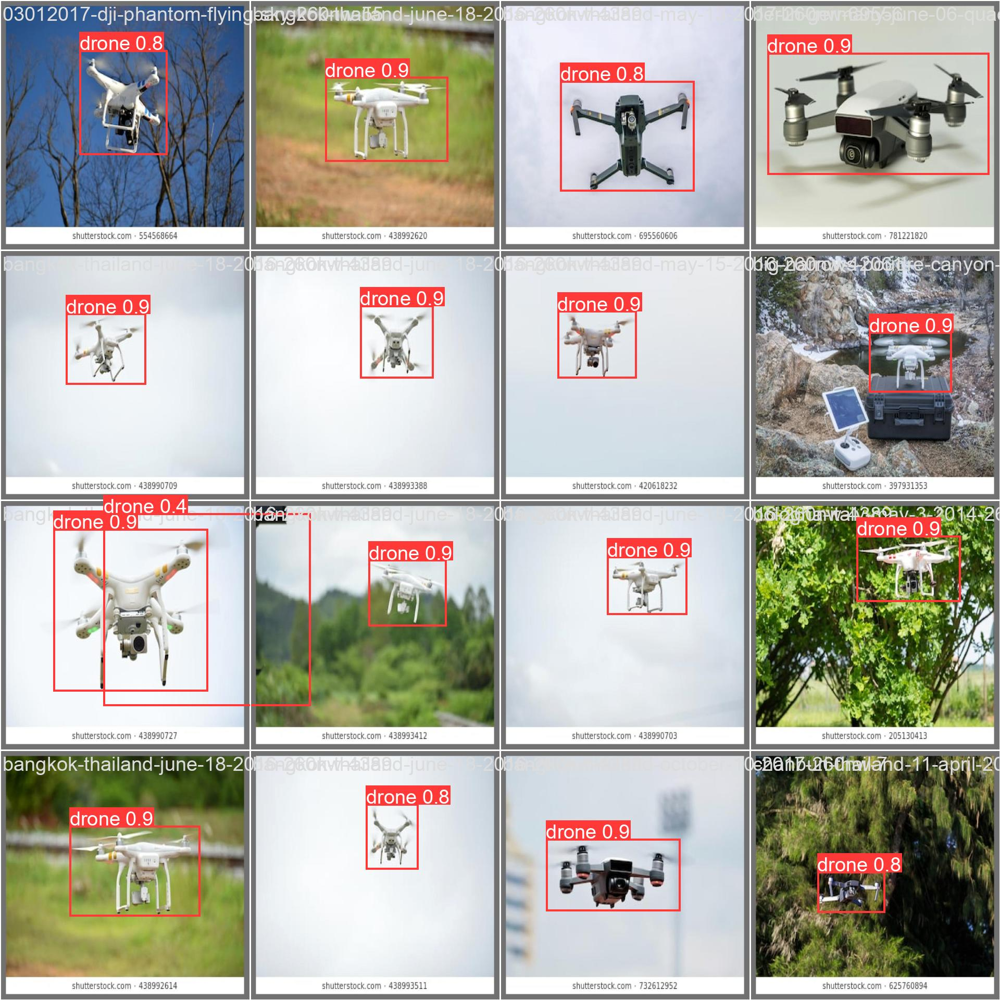

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=600)

## Validating Custom Model using Best Weights

---



In [ ]:

!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data=/content/dataset/data.yaml

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/dataset/valid/labels.cache... 47 images, 0 backgrounds, 0 corrupt: 100% 47/47 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 3/3 [00:03<00:00,  1.30s/it]
                   all         47         47      0.976      0.979      0.988      0.802
Speed: 13.7ms preprocess, 33.0ms inference, 0.0ms loss, 22.2ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


## Inference with Custom Model

In [ ]:

!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.25 source=/content/dataset/test/images save=True

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs

image 1/47 /content/dataset/test/images/03012017-dji-phantom-flying-sky-260nw-554568589_jpg.rf.8f59650b057cf5552f8450f927353152.jpg: 640x640 1 drone, 16.3ms
image 2/47 /content/dataset/test/images/18th-july-2017-kuantanpahangmalaysia-dji-260nw-681114889_jpg.rf.498746bd45d240b0dcd9b0456c65c910.jpg: 640x640 2 drones, 16.4ms
image 3/47 /content/dataset/test/images/18th-july-2017-kuantanpahangmalaysia-dji-260nw-681114895_jpg.rf.083b82ad8986e203f7ac5a547f41f03b.jpg: 640x640 1 drone, 16.3ms
image 4/47 /content/dataset/test/images/18th-july-2017-kuantanpahangmalaysia-dji-260nw-681114904_jpg.rf.26ba4eb299f2629ad5e3a758775391bf.jpg: 640x640 1 drone, 16.3ms
image 5/47 /content/dataset/test/images/19th-july-2017-pahang-malaysia-260nw-680436289_jpg.rf.a237a7c5c20d710fa9d5f2435c27b5bd.jpg: 640x640 2 drones, 16.3ms
image 6/47 /conte

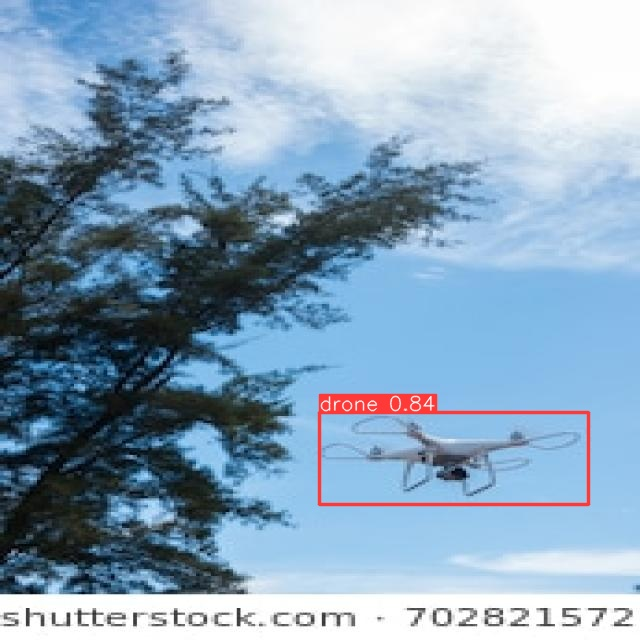

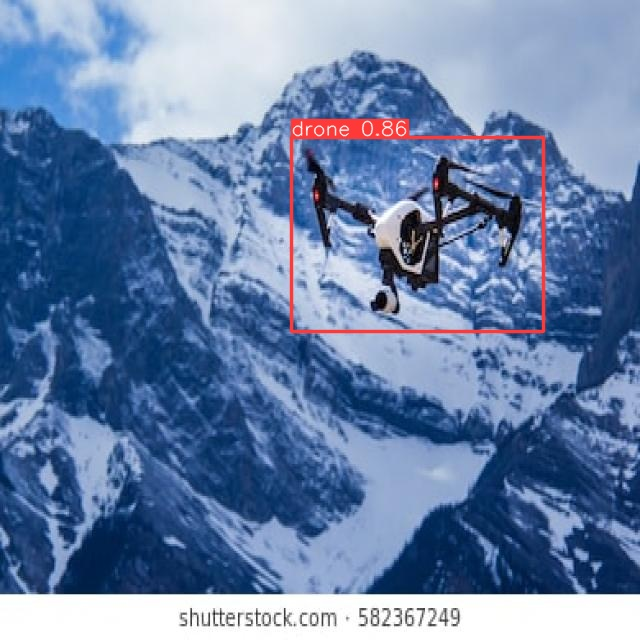

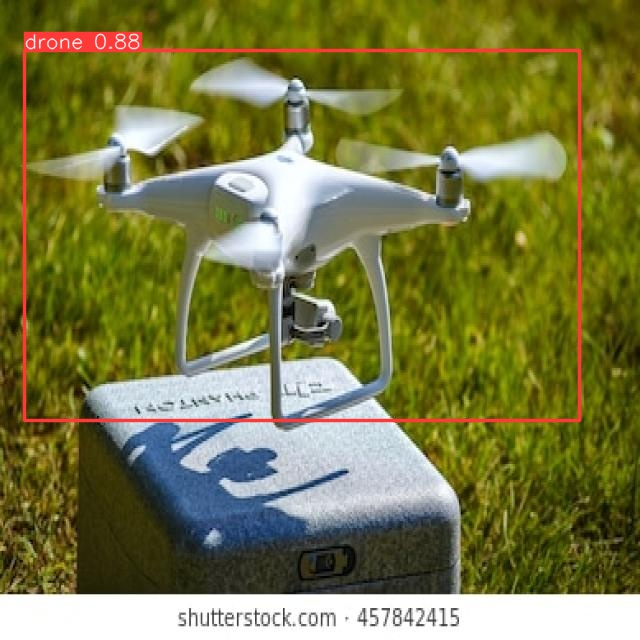

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict/*.jpg')[:3]:
      display(Image(filename=image_path, width=600))
      print("\n")

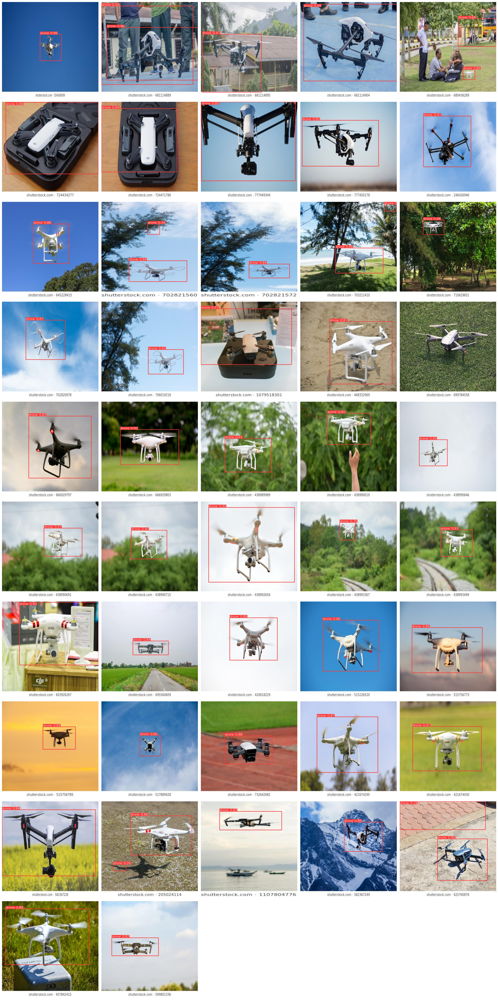

In [ ]:
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Directory containing images
image_dir = f'{HOME}/runs/detect/predict'
image_files = sorted(glob.glob(image_dir + '/*.jpg'))

# Parameters for the grid
total_images = len(image_files)
cols = 5
rows = (total_images + cols - 1) // cols  # Ceiling division

fig, axs = plt.subplots(rows, cols, figsize=(25, 5 * rows))  # Adjust the figure size as needed

# Loop through the images
for i, img_file in enumerate(image_files):
    img = mpimg.imread(img_file)

    # Calculate row and column position
    row = i // cols
    col = i % cols

    # Display the image
    axs[row, col].imshow(img)
    axs[row, col].axis('off')  # Hide the axes

# Hide any unused subplots
for i in range(total_images, rows * cols):
    axs[i // cols, i % cols].axis('off')

plt.tight_layout()
plt.show()
